In [1]:
# reference: https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_unclip#text-guided-image-to-image-variation

# NEED THIS TO SAVE TO BIGGER DRIVE
import os
# os.environ['HF_HOME'] = '/datastor1/jiahuikchen/hf_cache' # CS A40 box
os.environ['HF_HOME'] = '/home/jc98685/hf_cache' # MIDI-02

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

from diffusers import StableUnCLIPImg2ImgPipeline
from diffusers.utils import load_image
import torch

### Image and Text Conditioned UnClip

In [24]:
img_txt_pipe = StableUnCLIPImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1-unclip", torch_dtype=torch.float16, # variation="fp16"
)
img_txt_pipe = img_txt_pipe.to("cuda:2")

Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

### Text Conditioned UnClip

This model is pretty bad, I think it's cause the open-sourced version of the DALLE2 text encoder only works with "small" version of the stable diffusion model. 

In [17]:
import torch
from diffusers import UnCLIPScheduler, DDPMScheduler, StableUnCLIPPipeline
from diffusers.models import PriorTransformer
from transformers import CLIPTokenizer, CLIPTextModelWithProjection

prior_model_id = "kakaobrain/karlo-v1-alpha"
data_type = torch.float16
prior = PriorTransformer.from_pretrained(prior_model_id, subfolder="prior", torch_dtype=data_type)

prior_text_model_id = "openai/clip-vit-large-patch14"
prior_tokenizer = CLIPTokenizer.from_pretrained(prior_text_model_id)
prior_text_model = CLIPTextModelWithProjection.from_pretrained(prior_text_model_id, torch_dtype=data_type)
prior_scheduler = UnCLIPScheduler.from_pretrained(prior_model_id, subfolder="prior_scheduler")
prior_scheduler = DDPMScheduler.from_config(prior_scheduler.config)

stable_unclip_model_id = "stabilityai/stable-diffusion-2-1-unclip-small"

txt_pipe = StableUnCLIPPipeline.from_pretrained(
    stable_unclip_model_id,
    torch_dtype=data_type,
    # variant="fp16",
    prior_tokenizer=prior_tokenizer,
    prior_text_encoder=prior_text_model,
    prior=prior,
    prior_scheduler=prior_scheduler,
)

txt_pipe = txt_pipe.to("cuda:1")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

## Generation Setup
Prompts, code, etc.

In [8]:
# text only generation
def gen_images_from_text(prompts):
    for prompt in prompts:
        images = txt_pipe(prompt=prompt, num_images_per_prompt=4).images

        f, axarr = plt.subplots(1,4, figsize=(20, 20))
        axarr[0].imshow(images[0]); axarr[0].axis("off"); axarr[0].set_title(prompt)
        axarr[1].imshow(images[1]); axarr[1].axis("off"); axarr[1].set_title(prompt)
        axarr[2].imshow(images[2]); axarr[2].axis("off"); axarr[2].set_title(prompt)
        axarr[3].imshow(images[3]); axarr[3].axis("off"); axarr[3].set_title(prompt)

# text and image generation
# prompts_and_imgs is list of tuples (prompt, image)
def gen_images_from_text_and_img(prompts_and_imgs):
    for tup in prompts_and_imgs:
        prompt = tup[0]
        img = tup[1]
        images = img_txt_pipe(img, prompt=prompt, num_images_per_prompt=4).images

        f, axarr = plt.subplots(1,4, figsize=(20, 20))
        axarr[0].imshow(images[0]); axarr[0].axis("off"); axarr[0].set_title(prompt)
        axarr[1].imshow(images[1]); axarr[1].axis("off"); axarr[1].set_title(prompt)
        axarr[2].imshow(images[2]); axarr[2].axis("off"); axarr[2].set_title(prompt)
        axarr[3].imshow(images[3]); axarr[3].axis("off"); axarr[3].set_title(prompt)

# both types of generation
# def gen_images(prompts, prompts_and_imgs):
    

  0%|          | 0/21 [00:00<?, ?it/s]

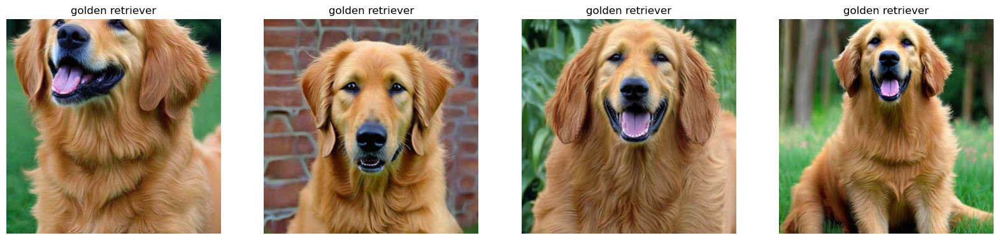

In [25]:
prompts_and_imgs = [("golden retriever", 
                     load_image("https://www.vidavetcare.com/wp-content/uploads/sites/234/2022/04/golden-retriever-dog-breed-info.jpeg"),
                    )]

gen_images_from_text_and_img(prompts_and_imgs)

In [22]:
# generate images for prompts (these prompts are used for image-and-text conditioning too)

animal_prompts = ["golden retriever", "tabby cat", "rabbit", "monkey", "snake"]
people_prompts = ["doctor", "nurse", "teacher", "programmer"]
homonym_prompts = ["bat", "spring", "fly", "bow"]

# Text-Conditioned Generations

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

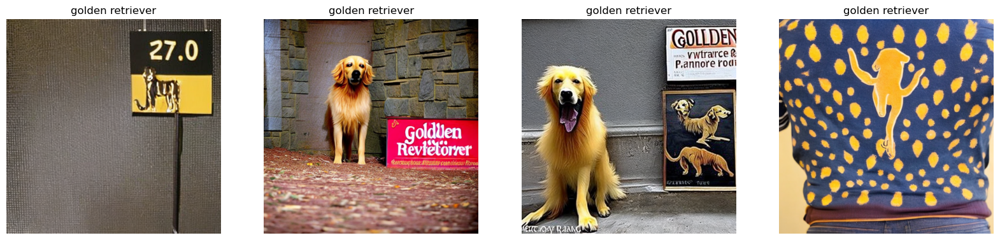

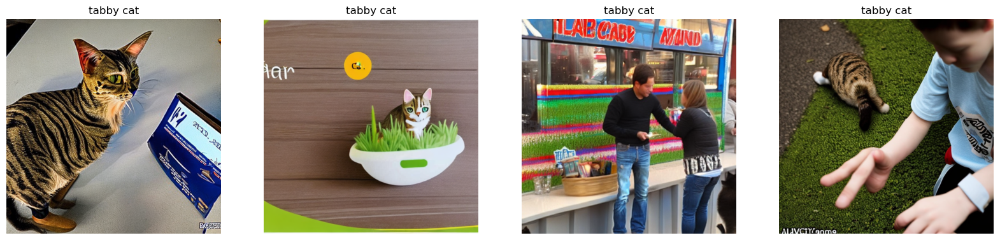

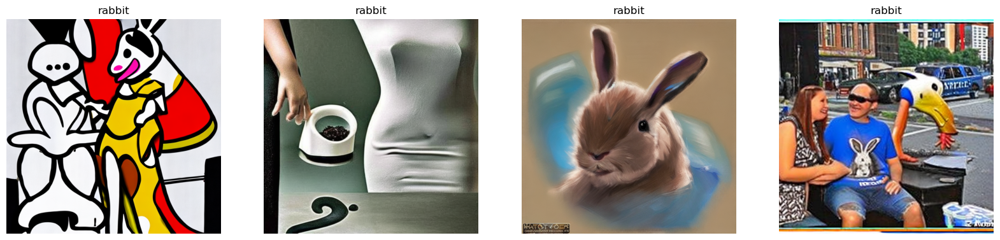

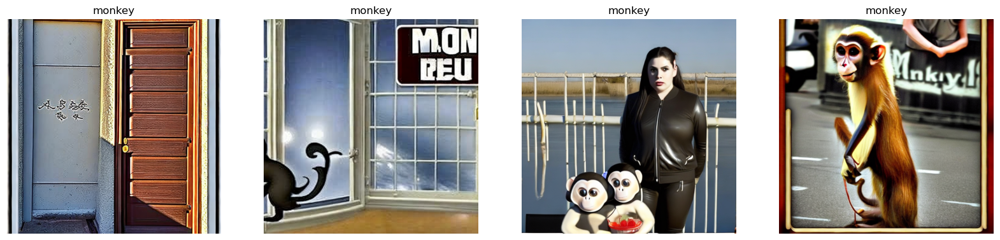

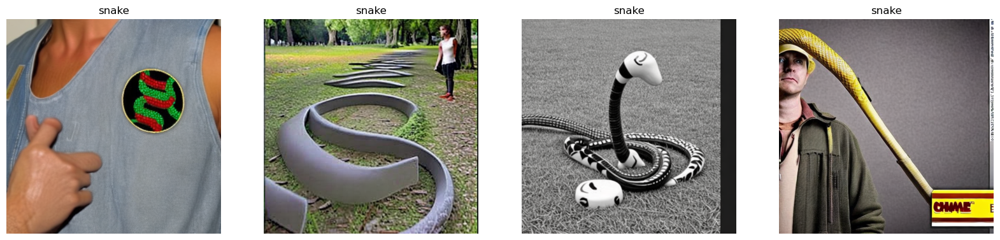

In [23]:
# animals
gen_images_from_text(animal_prompts)

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

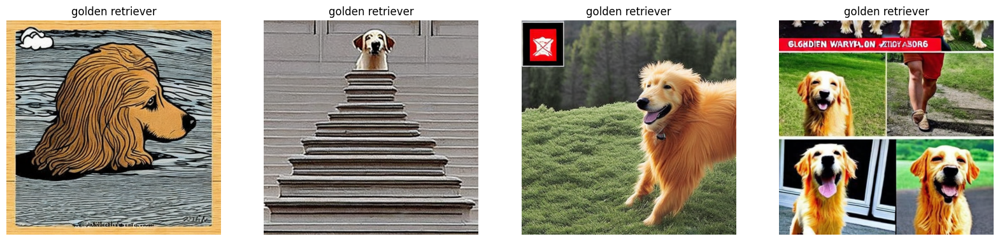

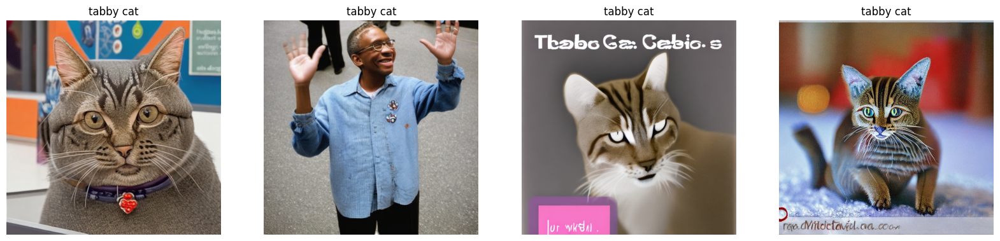

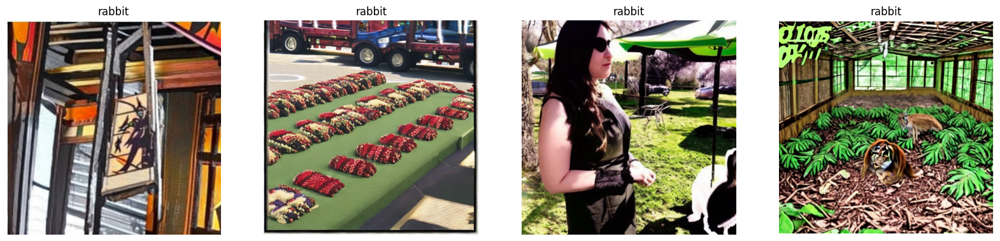

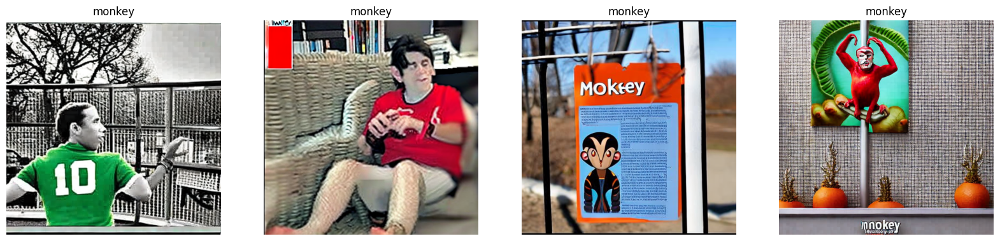

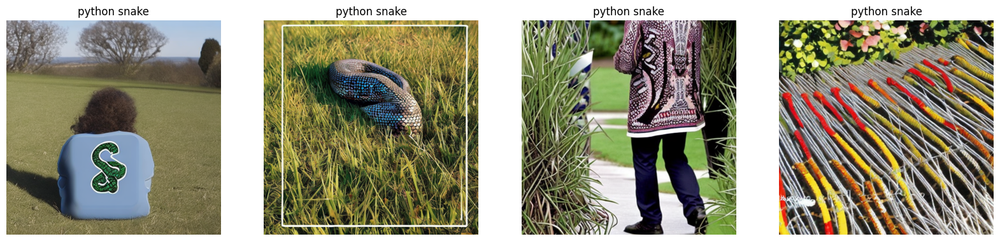

In [71]:
# animals
gen_images_from_text(animal_prompts)

# Text-and-Image Conditioned Generations

In [ ]:
# generate images for prompts + images 

# animal images to feed in: cartoon version, 3D version
# people: 3 gender variations, caucasian and black, old person and young person
# objects: pictures of the niche alternate meaning objects

## Prev Generations/Extra Content

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

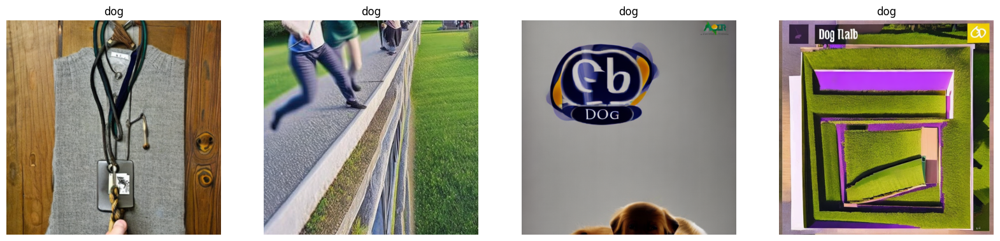

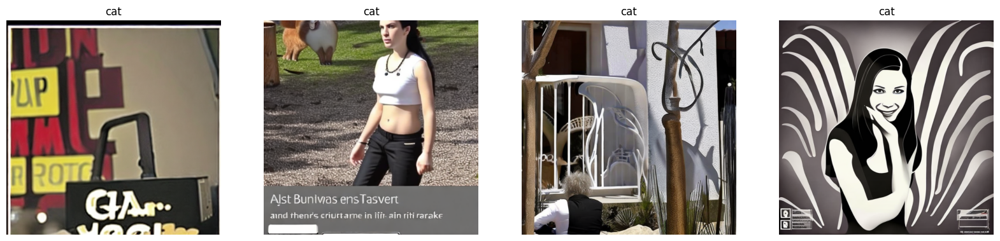

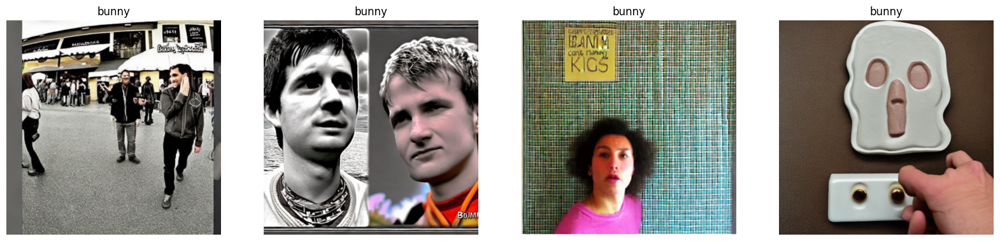

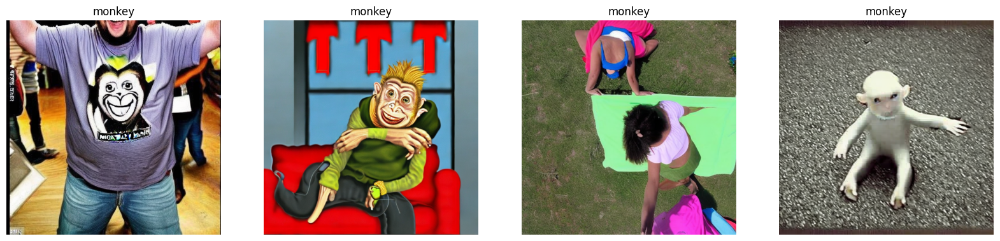

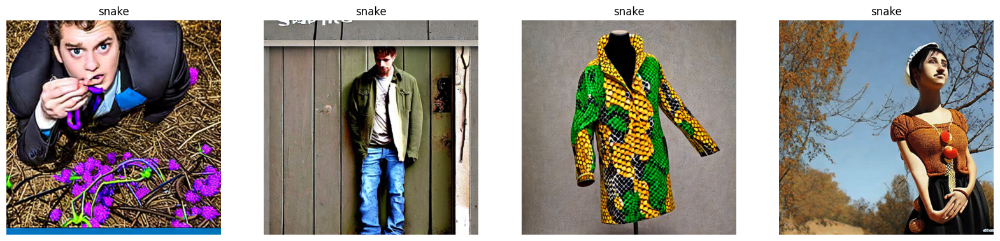

In [69]:
# simple animals the model is bad at... 
animal_prompts = ["dog", "cat", "bunny", "monkey", "snake"]
gen_images_from_text(animal_prompts)